In [1]:
# use pytorch_env

import os

import numpy as np
import pandas as pd
import seaborn as sns

import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

import pickle

In [2]:
pkl_file = open('df.pkl', 'rb')
df = pickle.load(pkl_file)
pkl_file.close()

In [12]:
print(df.shape)
print(df['img_id'].unique().shape)

(7009, 9)
(816,)


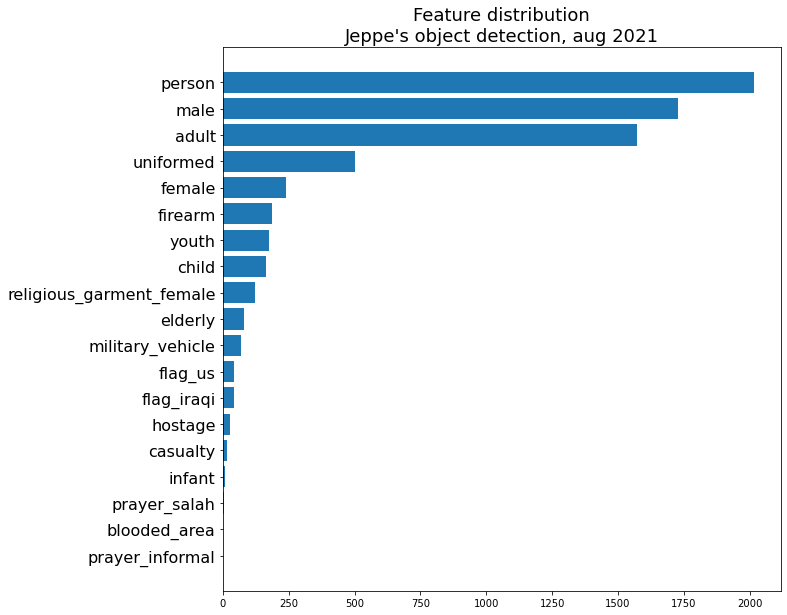

In [3]:
def feature_dist_plot(df, show = False):

    features_count = df.groupby('feature').count().sort_values(['img_id'], ascending = True)[['img_id']].reset_index()

    plt.figure(figsize = [10,10])

    plt.title("Feature distribution\nJeppe's object detection, aug 2021", fontsize = 18)

    plt.barh(np.arange(0, features_count.shape[0],1) ,features_count['img_id'])
    plt.yticks(np.arange(0,features_count.shape[0],1), features_count['feature'], fontsize = 16)


    plt.savefig(f'feature_dist.pdf', bbox_inches="tight")   

    if show == True:
        plt.show()

feature_dist_plot(df, show = False)

In [4]:

def plt_obj(df_sub, image_i, feature):

    """df_sub is the random subset df given sh and class_int.
    image_i is the i in the iteration. 
    classes in the list of classes. 
    Shape is img.shape.
    class_int is just the class in passed to the function above"""

    color = 'salmon'
    
    for _, row in df_sub[df_sub['img_id'] == image_i].iterrows():
        
        xmin =  row['xmin']
        xmax = row['xmax']
        ymin = row['ymin']
        ymax = row['ymax']

        xdiff = xmax - xmin
        ydiff = ymax - ymin

        xcenter = xmin + xdiff/2
        ycenter = ymin + ydiff/2


        plt.plot(xcenter, ycenter,'o', ms = 15, alpha = 0.5, color = color)

        plt.hlines(ycenter, xmin, xmax, color = color)
        plt.vlines(xcenter, ymin, ymax, color = color)

        plt.annotate(feature, [xmin, ymax], fontsize = 20, color = color)
                
        rect = Rectangle((xmin, ymin),xdiff,ydiff,linewidth = 2, edgecolor = color, facecolor='none')
        
        ax = plt.gca()
        ax.add_patch(rect)



In [5]:
def plot_img_subset(feature, show = False):

    dir_images = '/home/simon/Documents/Bodies/data/jeppe/images'
    n = 9 # must be a square number: 1, 4, 9, 16, 25, 36, 49

    df_sub = df[df['feature'] == feature]
    img_subset = np.random.choice(df_sub['img_id'], n)

    plt.figure(figsize = [15,10])

    for i, j in enumerate(img_subset):
        path_image = f'{dir_images}/{j}.jpg'

        plt.subplot(np.sqrt(n), np.sqrt(n), i+1)
        plt.subplots_adjust(hspace = 0.2, wspace = 0.1)

        img = cv2.imread(path_image)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # correcting the colors:
        plt.imshow(img)
        plt.title(j)

        suptitle = f'{feature}'
        plt.suptitle(suptitle, size=16)

        plt_obj(df_sub, j, feature)

    plt.savefig(f'{suptitle}.pdf', bbox_inches="tight")  

    if show == True:  
        plt.show()

# Single feature test:
#plot_img_subset('firearm')

<ipython-input-5-39bf2100d16a>:14: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.sqrt(n), np.sqrt(n), i+1)
<ipython-input-5-39bf2100d16a>:14: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.sqrt(n), np.sqrt(n), i+1)
<ipython-input-5-39bf2100d16a>:14: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.sqrt(n), np.sqrt(n), i+1)
<ipython-input-5-39bf2100d16a>:14: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.sqrt(n), np.sqrt(n), i+1)
<ipython-input-5-39bf2100d16a>:14: Matplotli

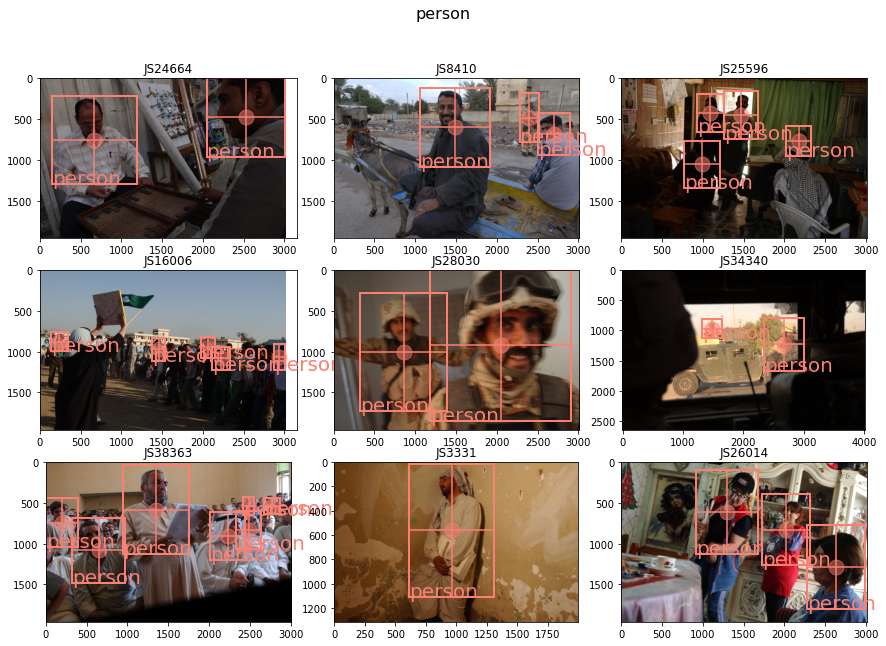

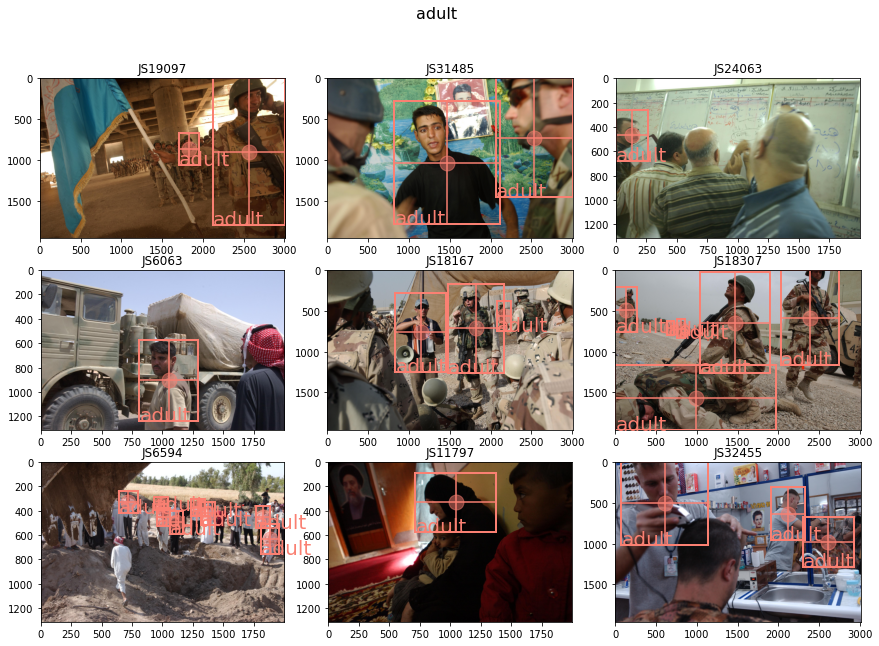

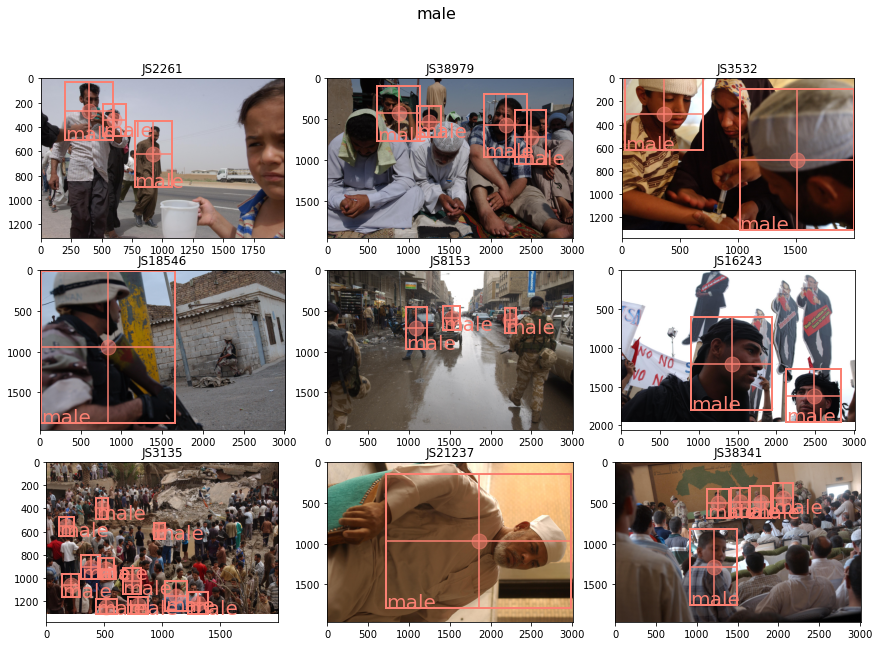

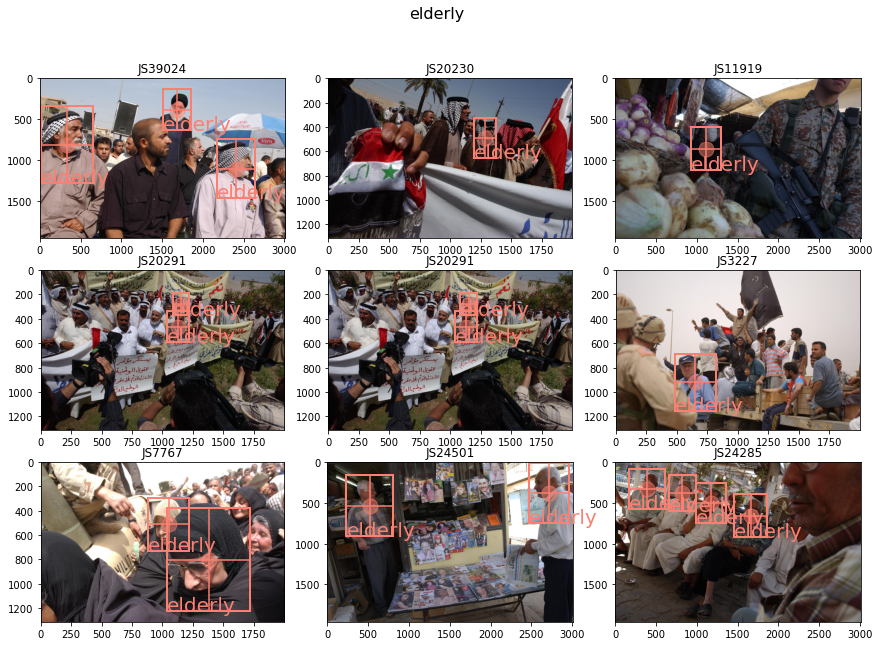

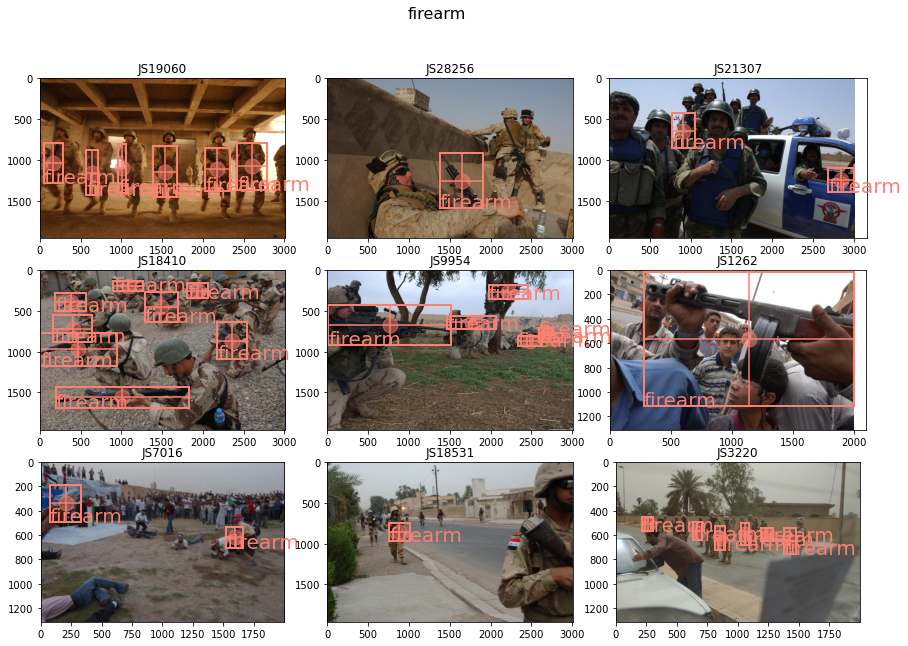

...

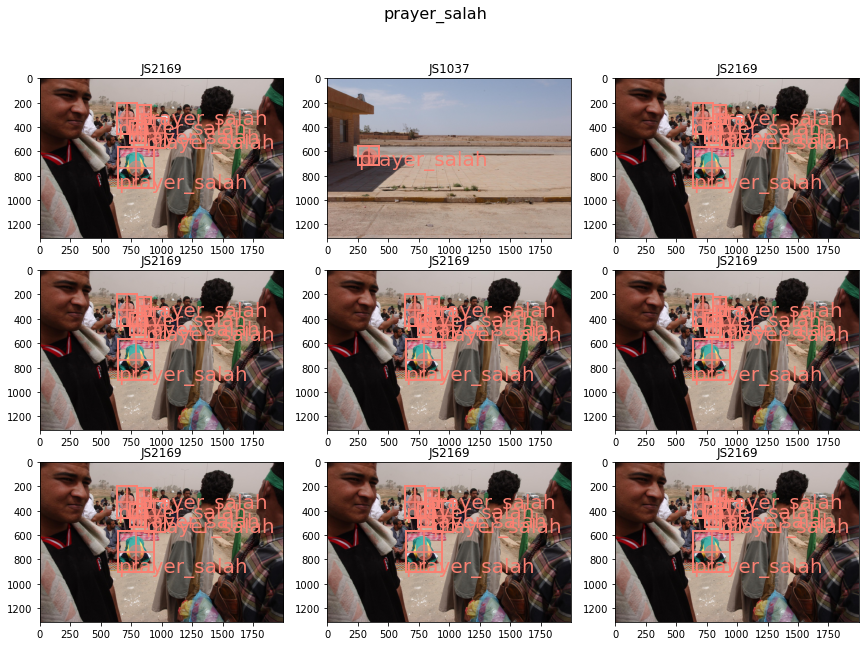

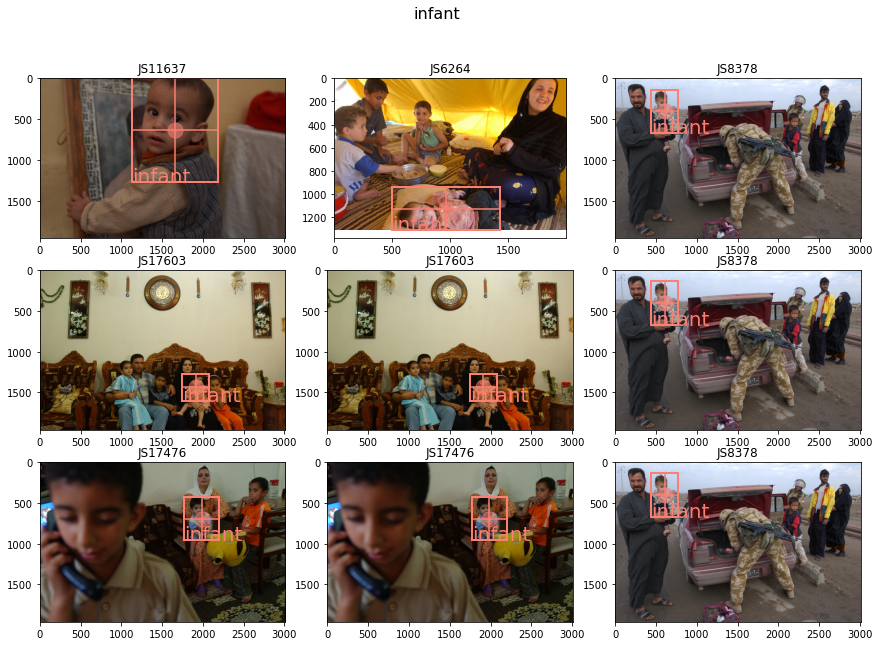

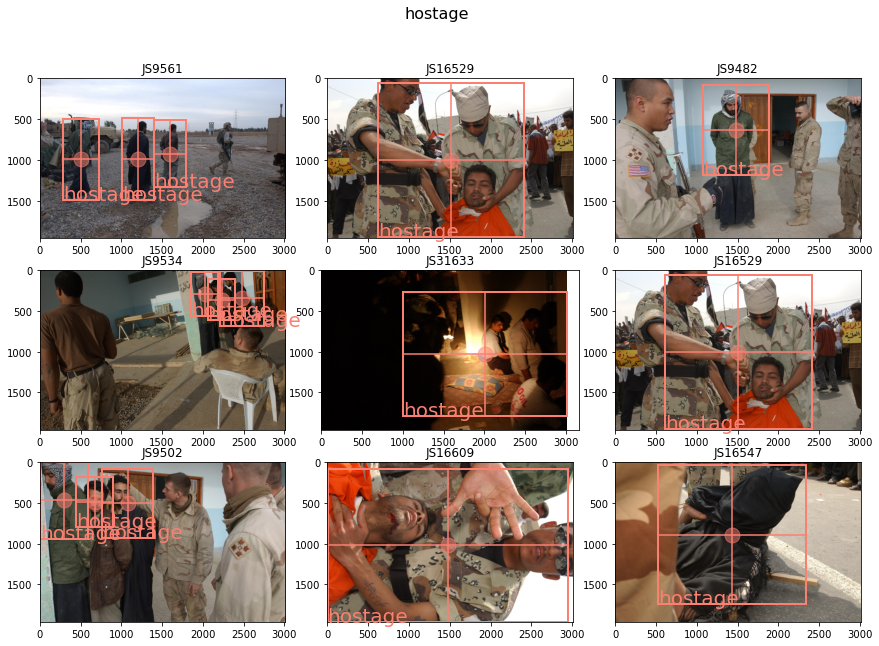

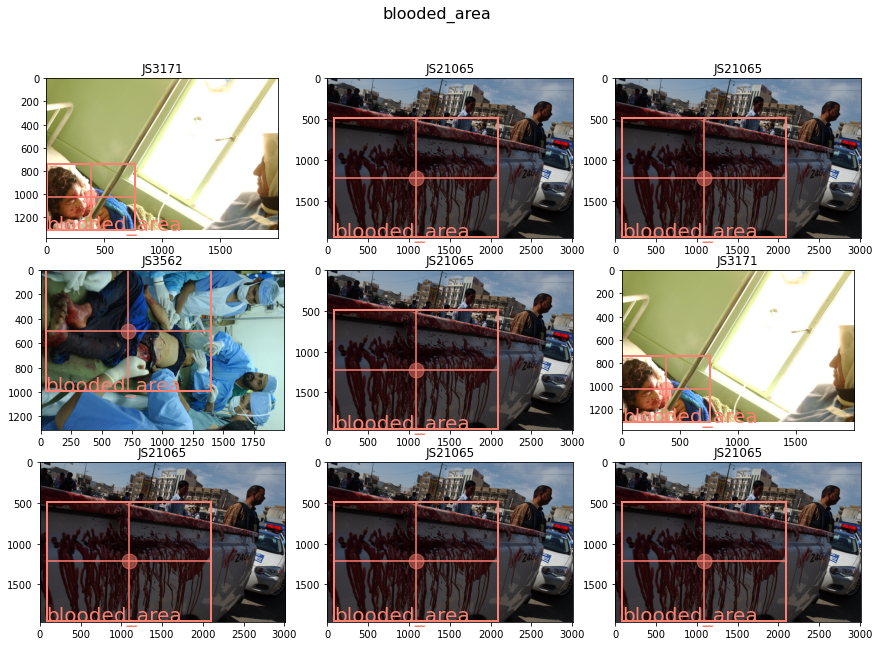

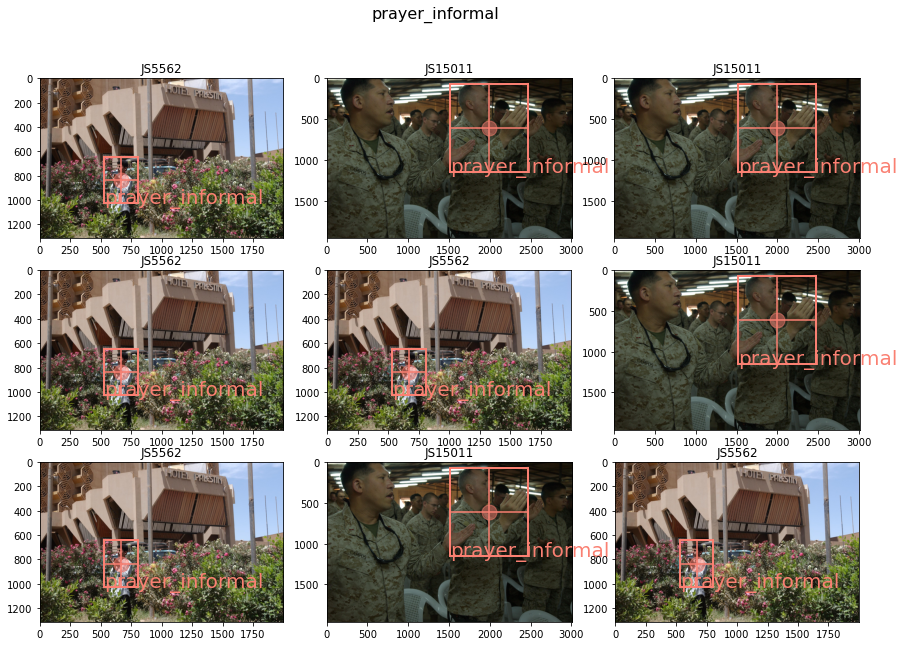

In [6]:
for i in df['feature'].unique():
    plot_img_subset(i)